# RandomForest Exoplanet Classification using Cumulative Object of Interest Data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

pd.set_option('display.max_row', 100)
pd.set_option('display.max_columns', 75)

## RandomForest Classifier


In [2]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn import metrics as mt
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit, cross_validate

Read pickle files from Data Prep.

In [3]:
#Read Pickle Files
#try:
#    del df_rfecvTrainFillX, df_rfecvTestFillX, df_rfecvTrainMiceX, df_rfecvTestMiceX, topExoTrainFillX, topExoTestFillX, topExoTrainMiceX, topExoTestMiceX
#except Exception as e:
#    print(e)
    
df_scaledTrainFillX = pd.read_pickle("./pkl/df_scaledTrainFillX.pkl")
df_scaledTestFillX = pd.read_pickle("./pkl/df_scaledTestFillX.pkl")
df_scaledTrainMiceX = pd.read_pickle("./pkl/df_scaledTrainMiceX.pkl")
df_scaledTestMiceX = pd.read_pickle("./pkl/df_scaledTestMiceX.pkl")

exoTestFillX = pd.read_pickle("./pkl/exoTestFillX.pkl")
exoTrainFillX = pd.read_pickle("./pkl/exoTrainFillX.pkl")
exoTestMiceX = pd.read_pickle("./pkl/exoTestMiceX.pkl")
exoTrainMiceX = pd.read_pickle("./pkl/exoTrainMiceX.pkl")
exoTrainX = pd.read_pickle('./pkl/exoTrainX.pkl')
exoTestX = pd.read_pickle('./pkl/exoTestX.pkl')

#Response Variables
exoTrainFillY = pd.read_pickle("./pkl/exoTrainFillY.pkl")
exoTestFillY = pd.read_pickle("./pkl/exoTestFillY.pkl")
exoTrainMiceY = pd.read_pickle("./pkl/exoTrainMiceY.pkl")
exoTestMiceY = pd.read_pickle("./pkl/exoTestMiceY.pkl")
exoTestY = pd.read_pickle("./pkl/exoTestY.pkl")
exoTrainY = pd.read_pickle("./pkl/exoTrainY.pkl")

Reduce potential bias by dropping 'koi_count'.

In [4]:
exoTestFillX.drop(['koi_count'], inplace=True, axis=1)
exoTrainFillX.drop(['koi_count'], inplace=True, axis=1)

exoTrainMiceX.drop(['koi_count'], inplace=True, axis=1)
exoTestMiceX.drop(['koi_count'], inplace=True, axis=1)

df_scaledTrainFillX.drop(['koi_count'], inplace=True, axis=1)
df_scaledTestFillX.drop(['koi_count'], inplace=True, axis=1)

df_scaledTrainMiceX.drop(['koi_count'], inplace=True, axis=1)
df_scaledTestMiceX.drop(['koi_count'], inplace=True, axis=1)

#### RandomForest Classifier Function

In [43]:
def runModelCV(X, y, cv, clf, varImp = True):
    imps = list()
    accList = list()
    i = 1
    for train_index, test_index in cv.split(X, y):
        X_train, X_test = X.values[train_index], X.values[test_index]
        y_train, y_test = y.values[train_index], y.values[test_index]  
        clf.fit(X_train, y_train)
        acc = clf.score(X_test, y_test)
        accList.append(acc)
        print("Model", i, "Accuracy:", acc)
        imps.append(clf.feature_importances_)
        i += 1
    
    print("Mean Accuracy Across Models: ",np.mean(np.asarray(accList)))
    
    if(varImp):
        fig, ax = plt.subplots(figsize=(15,10))
        im = ax.imshow(imps, cmap='RdBu')

        ax.set_xticks(np.arange(X.shape[1]))
        ax.set_yticks(np.arange(i - 1))
        ax.set_xticklabels(list(X))
        ax.set_yticklabels(np.arange(i) + 1)
        ax.set_xlabel("Feature")
        ax.set_ylabel("Model")
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
                 rotation_mode="anchor")
        ax.set_title("Comparison of Variable Importance Across CV Runs")
        fig.tight_layout()
        plt.show()

#### GridSearchCV

In [75]:
%%time

#GridSearchCV SVC
from sklearn.model_selection import GridSearchCV

#Create Cross Validation Objects
#cvss = ShuffleSplit(n_splits = 10, test_size=0.20, random_state=0)
cvsss = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=0)
cv = StratifiedKFold(n_splits=5)

rfEst = RandomForestClassifier()

parameters = { 'n_estimators':[100, 200, 300, 400, 500, 600]
              ,'max_features': [None, "auto", "sqrt", "log2"]
              #,'min_samples_split': [20, 50, 100, 200]
              , 'max_depth': [7, 8, 9]
              , 'min_samples_leaf': [5, 10, 20]
              ,'random_state': [0]
             }

#Create a grid search object using the  
regGridSearch = GridSearchCV(estimator=rfEst
                   , n_jobs=-1 # jobs to run in parallel
                   , verbose=1 # low verbosity
                   , param_grid=parameters
                   #, cv=cv
                   , cv=cvsss
                   , scoring='recall') #'accuracy' 'f1' 'recall'


CPU times: user 379 µs, sys: 0 ns, total: 379 µs
Wall time: 385 µs


In [76]:
%%time
#Perform hyperparameter search to find the best combination of parameters for our data
regGridSearch.fit(exoTrainFillX, exoTrainFillY)
print(regGridSearch.best_params_, regGridSearch.best_score_)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 22.8min finished


{'max_features': None, 'random_state': 0, 'max_depth': 8, 'n_estimators': 500, 'min_samples_leaf': 5} 0.9873913043478261
CPU times: user 59.2 s, sys: 597 ms, total: 59.8 s
Wall time: 23min 38s


In [77]:
#regGridSearch.fit(exoTrainMiceX, exoTrainMiceY)
#print(regGridSearch.best_params_, regGridSearch.best_score_)
rfClf = regGridSearch.best_estimator_
print(rfClf)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)


### RandomForest Modeling for Different Missing Value Strategies

Zero Filled
Model 1 Accuracy: 0.9957983193277311
Model 2 Accuracy: 0.9985994397759104
Model 3 Accuracy: 0.9939309056956116
Model 4 Accuracy: 0.9948646125116714
Model 5 Accuracy: 0.9967320261437909
Model 6 Accuracy: 0.9967320261437909
Model 7 Accuracy: 0.9957983193277311
Model 8 Accuracy: 0.9957983193277311
Model 9 Accuracy: 0.9967320261437909
Model 10 Accuracy: 0.9971988795518207
Mean Accuracy Across Models:  0.996218487394958


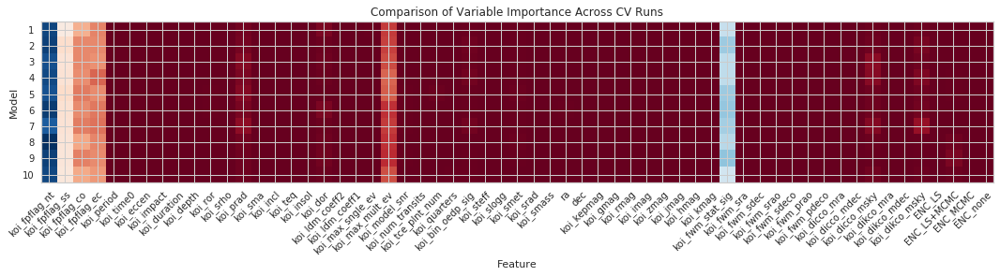

CPU times: user 5min 43s, sys: 71.1 ms, total: 5min 43s
Wall time: 5min 43s


In [78]:
%%time
print("Zero Filled")
runModelCV(exoTrainFillX, exoTrainFillY, StratifiedShuffleSplit(n_splits = 10, test_size = 0.3, train_size=0.7, random_state=0),
          rfClf)

KNN Imputation
Model 1 Accuracy: 0.9883286647992531
Model 2 Accuracy: 0.9892623716153128
Model 3 Accuracy: 0.9836601307189542
Model 4 Accuracy: 0.9850606909430439
Model 5 Accuracy: 0.9855275443510738
Model 6 Accuracy: 0.9915966386554622
Model 7 Accuracy: 0.9883286647992531
Model 8 Accuracy: 0.9873949579831933
Model 9 Accuracy: 0.9906629318394025
Model 10 Accuracy: 0.9897292250233427
Mean Accuracy Across Models:  0.9879551820728292


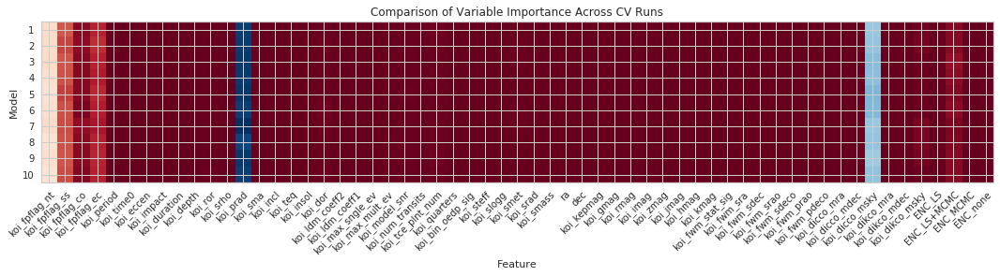

CPU times: user 7min 49s, sys: 94.9 ms, total: 7min 49s
Wall time: 7min 49s


In [79]:
%%time
print("KNN Imputation")
runModelCV(exoTrainMiceX, exoTrainMiceY, StratifiedShuffleSplit(n_splits = 10, test_size = 0.3, train_size=0.7, random_state=0),
          rfClf)

In [45]:
#%%time
#print("Scaled Zero Filled")
#runModelCV(df_scaledTrainFillX, exoTrainFillY, StratifiedShuffleSplit(n_splits = 10, test_size = 0.3, train_size=0.7, random_state=0),
#          RandomForestClassifier(min_samples_leaf=5, max_features=None, n_estimators=400, max_depth=15, random_state=0, n_jobs=-1))

In [46]:
#%%time
#print("Scaled KNN Imputation")
#runModelCV(df_scaledTrainMiceX, exoTrainMiceY, StratifiedShuffleSplit(n_splits = 10, test_size = 0.3, train_size=0.7, random_state=0),
#          RandomForestClassifier(min_samples_leaf=5, max_features=None, n_estimators=400, max_depth=15, random_state=0, n_jobs=-1))

### Generate Graphics and Predictions

In [80]:
#From https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

from sklearn.tree import export_graphviz

#rfClf = RandomForestClassifier(n_estimators=400, max_depth=9, min_samples_split=100, random_state=0,  n_jobs=-1)
#rfClf = RandomForestClassifier(max_features='auto', n_estimators=100, max_depth=10, min_samples_split=20, random_state=0,  n_jobs=-1)
#rfClf = RandomForestClassifier(min_samples_leaf=10, max_features=None, n_estimators=400, max_depth=8, random_state=0, n_jobs=-1)

#rfClf.fit(exoTrainFillX, exoTrainFillY)
#rfYHat = rfClf.predict(exoTrainFillX)
#acc = mt.accuracy_score(exoTrainFillY, rfYHat)
#conf = mt.confusion_matrix(exoTrainFillY,rfYHat)
#prec = mt.precision_score(exoTrainFillY, rfYHat)
#recall = mt.recall_score(exoTrainFillY, rfYHat)
#f1 = mt.f1_score(exoTrainFillY, rfYHat)
#rocAuc = mt.roc_auc_score(exoTrainFillY, rfYHat)

rfClf.fit(exoTrainMiceX, exoTrainMiceY)
rfYHat = rfClf.predict(exoTrainMiceX)
acc = mt.accuracy_score(exoTrainMiceY, rfYHat)
conf = mt.confusion_matrix(exoTrainMiceY,rfYHat)
prec = mt.precision_score(exoTrainMiceY, rfYHat)
recall = mt.recall_score(exoTrainMiceY, rfYHat)
f1 = mt.f1_score(exoTrainMiceY, rfYHat)
rocAuc = mt.roc_auc_score(exoTrainMiceY, rfYHat)

print('accuracy:', acc.round(4))
print('precision:', prec.round(4))
print('recall:', recall.round(4))
print('F1:', f1.round(4))
print('ROC AUC:', rocAuc.round(4))
print(conf)    

accuracy: 0.994
precision: 0.9987
recall: 0.9826
F1: 0.9906
ROC AUC: 0.991
[[4838    3]
 [  40 2257]]


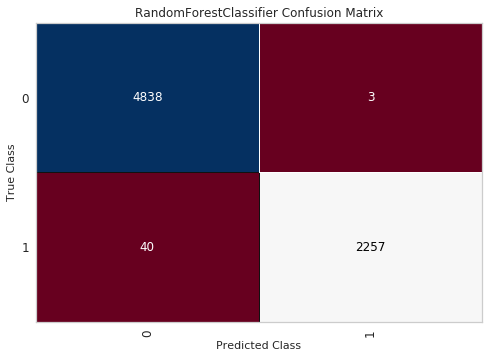

In [81]:
from yellowbrick.classifier import ConfusionMatrix

cm = ConfusionMatrix(rfClf, classes=[0,1], cmap='RdBU')
cm.fit(exoTrainMiceX, exoTrainMiceY)
cm.score(exoTrainMiceX, exoTrainMiceY)
cm.poof()

Scores from zero filled data set.

accuracy: 0.9962
precision: 0.9996
recall: 0.9887
F1: 0.9941
ROC AUC: 0.9942
[[4840    1]
 [  26 2271]]

       importance
count   59.000000
mean     0.016949
std      0.062954
min      0.000000
25%      0.000205
50%      0.000438
75%      0.001070
max      0.373382


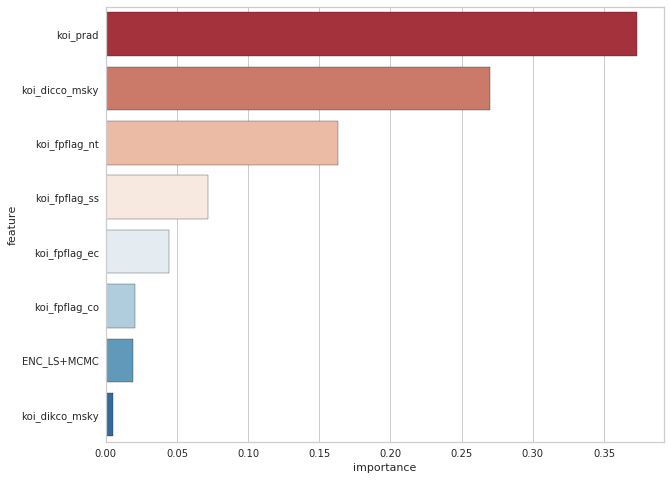

In [83]:
#Feature Importance Bar Plot
fi = pd.DataFrame({'feature': list(exoTrainMiceX.columns),
                   'importance': rfClf.feature_importances_}).\
                    sort_values('importance', ascending = False)

print(fi.describe())
#fi = fi[fi.importance > 0.001]

plt.figure(figsize=(10,8))
ax = sns.barplot(x='importance', y='feature', data=fi.iloc[0:8,:], palette="RdBu")

#### Random Forest Classification Trees

In [84]:
export_graphviz(rfClf.estimators_[5], out_file='treeDropKOICount.dot', feature_names=exoTrainFillX.columns, 
                class_names=["FALSE POSITIVE", "EXOPLANET"], rounded=True, proportion=False, precision=2, filled=True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'treeDropKOICount.dot', '-o', 'treeDropKOICount.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'treeDropKOICount.png')

In [85]:
yHat = rfClf.predict_proba(exoTestMiceX)

In [86]:
yHat = pd.DataFrame(yHat)
print("Greater Than 90%", np.count_nonzero(np.where(yHat[1] > 0.9)))
print("Greater Than 95%", np.count_nonzero(np.where(yHat[1] > 0.95)))

Greater Than 90% 1190
Greater Than 95% 968


In [87]:
yHat.describe()

,0,1
count,2426.000000,2426.000000
mean,0.380655,0.619345
std,0.395671,0.395671
min,0.000042,0.000098
25%,0.000042,0.182379
50%,0.121144,0.878856
75%,0.817621,0.999958
max,0.999902,0.999958


In [88]:
exoTestX_kepid = pd.read_pickle("./pkl/exoTestX_kepid.pkl")
exoTestX_kepid.describe()

count    2.426000e+03
mean     7.861219e+06
std      2.697777e+06
min      1.025986e+06
25%      5.786790e+06
50%      8.164700e+06
75%      9.988798e+06
max      1.288521e+07
Name: kepid, dtype: float64

In [89]:
dfKepID = pd.DataFrame(exoTestX_kepid.reset_index())
dfYHat = pd.DataFrame(yHat)

In [90]:
#join candidate kepler IDs to calculated probabilities
exoplanetsProb = dfKepID.join(dfYHat, how='outer')
exoplanetsProb.head()

,index,kepid,0,1
0,2,10811496,0.816820,0.183180
1,37,11138155,0.018925,0.981075
2,58,11818800,0.000042,0.999958
3,62,11918099,0.975826,0.024174
4,63,9579641,0.096235,0.903765


In [91]:
exoplanetsProb.columns = ['cumOOI_index', 'kepid', 'prob0', 'prob1']
exoplanetsProb.head()

,cumOOI_index,kepid,prob0,prob1
0,2,10811496,0.816820,0.183180
1,37,11138155,0.018925,0.981075
2,58,11818800,0.000042,0.999958
3,62,11918099,0.975826,0.024174
4,63,9579641,0.096235,0.903765


In [92]:
exoplanetsProb.sort_values(by=['prob1'], ascending=False, inplace=True)

In [93]:
exoplanetsProb.to_csv("./data/RFResultsDropKoiCount.csv")

#### Prediction Histograms and ScatterPlots

In [98]:
df1 = exoTestMiceX[['koi_prad','koi_duration', 'koi_dikco_msky']]
df1 = pd.merge(exoplanetsProb, df1, how='inner', left_on='cumOOI_index', right_index=True)
df1['logPrad'] = np.log(df1.koi_prad)
#player['adjSalary2'] = np.where(player['adjSalary'] == 0, player['adjMinSalaries'], player['adjSalary'])
df1['predDispose'] = np.where(df1.prob1 <= 0.5, 0, 1)
df1

,cumOOI_index,kepid,prob0,prob1,koi_prad,koi_duration,koi_dikco_msky,logPrad,predDispose
1213,5038,8880123,0.000042,0.999958,2.030000,7.25900,0.68000,0.708036,1
471,2369,11874577,0.000042,0.999958,1.880000,7.43400,0.29000,0.631272,1
500,2482,5953297,0.000042,0.999958,1.450000,2.75100,0.27000,0.371564,1
502,2484,9472074,0.000042,0.999958,1.330000,0.79180,0.25000,0.285179,1
1205,5010,8121328,0.000042,0.999958,1.630000,12.46200,0.83000,0.488580,1
1204,5007,2849140,0.000042,0.999958,1.250000,8.51800,0.58000,0.223144,1
1203,5004,11810124,0.000042,0.999958,1.880000,3.40900,0.44000,0.631272,1
1201,5000,5621333,0.000042,0.999958,1.480000,6.68400,0.90000,0.392042,1
507,2508,8263545,0.000042,0.999958,1.940000,2.38160,0.33000,0.662688,1
508,2514,7899070,0.000042,0.999958,4.490000,16.71510,0.08900,1.501853,1


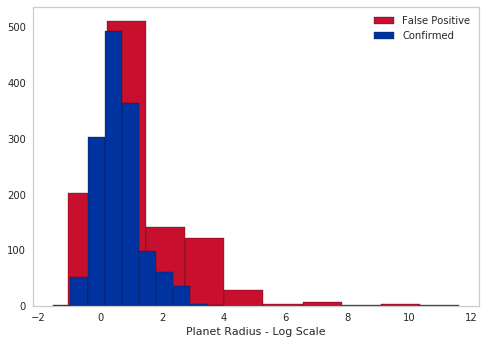

In [99]:
plt.rcParams["patch.force_edgecolor"] = True
plt.grid(False)
plt.hist(df1[df1.prob1 <= 0.5].logPrad, label='False Positive', color='#C8102E')
plt.hist(df1[df1.prob1 > 0.5].logPrad, label='Confirmed', color='#0033A0')
plt.legend(loc='upper right')
plt.xlabel("Planet Radius - Log Scale")
plt.show()

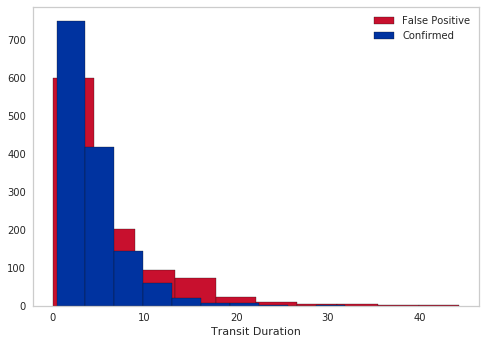

In [100]:
plt.grid(False)
plt.rcParams["patch.force_edgecolor"] = True
plt.hist(df1[df1.prob1 <= 0.5].koi_duration, label='False Positive', color='#C8102E')
plt.hist(df1[df1.prob1 > 0.5].koi_duration, label='Confirmed', color='#0033A0')
plt.legend(loc='upper right')
plt.xlabel("Transit Duration")
plt.grid(False)
plt.show()

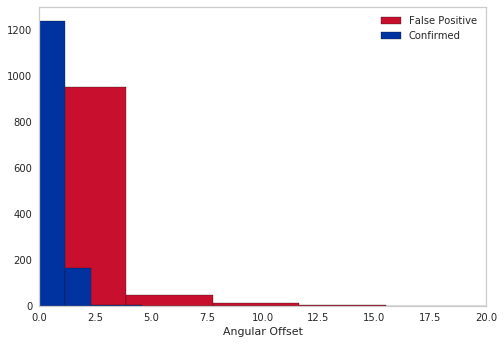

In [103]:
plt.grid(False)
plt.rcParams["patch.force_edgecolor"] = True
plt.hist(df1[df1.prob1 <= 0.5].koi_dikco_msky, label='False Positive', color='#C8102E')
plt.hist(df1[df1.prob1 > 0.5].koi_dikco_msky, label='Confirmed', color='#0033A0')
plt.xlim(right=20, left=0)
plt.legend(loc='upper right')
plt.xlabel("Angular Offset")
plt.grid(False)
plt.show()

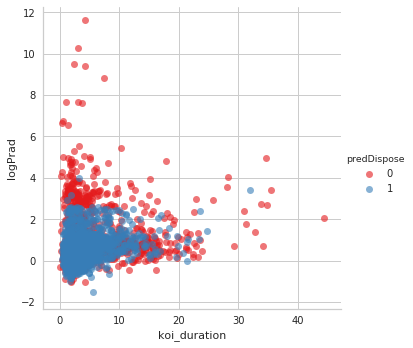

In [97]:
sns.set_style({'axes.grid' : True})
j = sns.lmplot(data=df1, x='koi_duration', y='logPrad', hue='predDispose', palette="Set1", scatter_kws={'alpha':0.6}, fit_reg=False)